# Exaploratory Analysis for Wilson's Odyssey

I'm taking the csv from the dataframer step into a Pandas dataframe.

In [1]:
%matplotlib inline
import pandas as pd
from tqdm import tqdm
tqdm.pandas()
pd.options.display.max_colwidth = 150 ###
import numpy as np
import re
import sys
import os
import matplotlib.pyplot as plt
# Add the directory containing visualization_utils.py to path
sys.path.append("/Users/debr/English-Homer/")
import visualization_utils as viz
import seaborn as sns
sns.set_style("whitegrid")
# palette astroblue   orange   genoa      carrot    tawny     neptune      SELAGO    mako   black
color = ['#003D59', '#FD6626','#177070','#FB871D','#641B5E','#86C3BC','#F5E1FD','#414A4F','k']
danB_plotstyle = {'figure.figsize': (12, 7), 
               'axes.labelsize': 'large', # fontsize for x and y labels (was large)
               'axes.titlesize': 'large', # fontsize for title
               'axes.titleweight': 'bold', # font type for title
               'xtick.labelsize': 'large', # fontsize for x 
               'ytick.labelsize':'small', # fontsize fory ticks
               'grid.color': 'k', # grid color
                'grid.linestyle': ':', # grid line style
                'grid.linewidth': 0.2, # grid line width
                'font.family': 'Times New Roman', # font family
                'grid.alpha': 0.5, # transparency of grid
               'figure.dpi': 300, # figure display resolution
               'savefig.bbox': 'tight', # tight bounding box
               'savefig.pad_inches': 0.4, # padding to use when saving
               'axes.titlepad': 15, # title padding
               'axes.labelpad': 8, # label padding
               'legend.borderpad': .6, # legend border padding
               'axes.prop_cycle': plt.cycler(
                color=color) # color cycle for plot lines
               }

# adjust matplotlib defaults
plt.rcParams.update(danB_plotstyle)

In [2]:
#csv to df
filepath = "/Users/debr/odysseys_en/Odyssey_dfs/Odyssey_Wilson_eda.csv"
df = pd.read_csv(filepath)

In [3]:
#Boolean check for missing values
if df.isna().sum().sum() == 0:
    print("No missing values")
else:
    for col in df.columns:
        if df[col].isna().sum() > 0:
            print(f"Missing values in {col}")


No missing values


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
year,24.0,2017.000000,0.000000,2017.0,2017.00,2017.0,2017.00,2017.0
book_num,24.0,12.500000,7.071068,1.0,6.75,12.5,18.25,24.0
num_lines,24.0,527.958333,114.398419,340.0,458.25,509.0,591.25,865.0
num_sentences,24.0,277.833333,63.797687,179.0,245.25,268.5,307.75,472.0
num_words,24.0,4064.791667,915.982484,2683.0,3477.25,3958.5,4662.00,6860.0


In [5]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[['scaled_num_words', 'scaled_num_sentences', 'scaled_num_lines']] = scaler.fit_transform(df[['num_words', 'num_sentences', 'num_lines']])

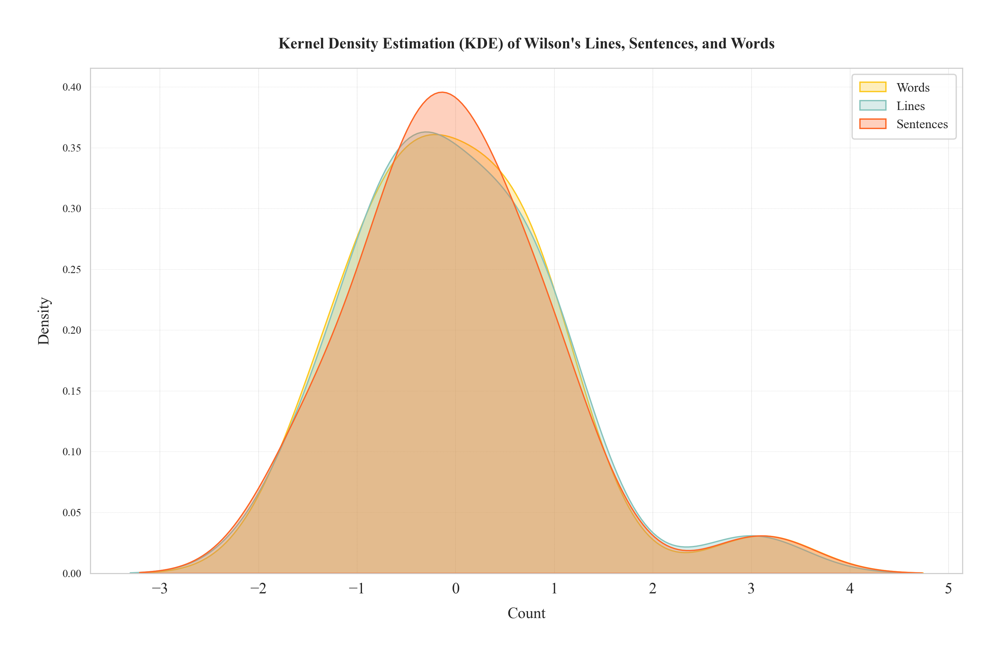

In [6]:
# KDE plot for Lines, Sentences, and Words
sns.kdeplot(df['scaled_num_words'], label="Words", color= "#fcc921", fill=True, alpha=0.3)
sns.kdeplot(df['scaled_num_lines'], label="Lines", color='#86C3BC', fill=True, alpha=0.3)
sns.kdeplot(df['scaled_num_sentences'], label="Sentences", color='#FD6626',fill=True, alpha=0.3)

plt.xlabel("Count")
plt.ylabel("Density")
plt.title("Kernel Density Estimation (KDE) of Wilson's Lines, Sentences, and Words")
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-KDE_Lines_Sentences_Words.png")
plt.show()

We can see that, compared to Green’s translation, Wilson’s translation exhibits a more balanced and uniform distribution across the 24 books. The alignment of the KDF plots for the number of lines, words, and sentence length suggests that Wilson maintains a consistent stylistic approach throughout. This indicates minimal stylistic divergence in terms of sentence structure and length. However, while these metrics point to uniformity in structural aspects, other stylistic elements—such as word choice, syntactic complexity, and tone—would require further analysis to determine the full extent of the differences between the translations.

In [7]:
df.columns

Index(['author', 'year', 'title', 'book_num', 'first_line', 'first_sentence',
       'text', 'num_lines', 'num_sentences', 'num_words', 'scaled_num_words',
       'scaled_num_sentences', 'scaled_num_lines'],
      dtype='object')

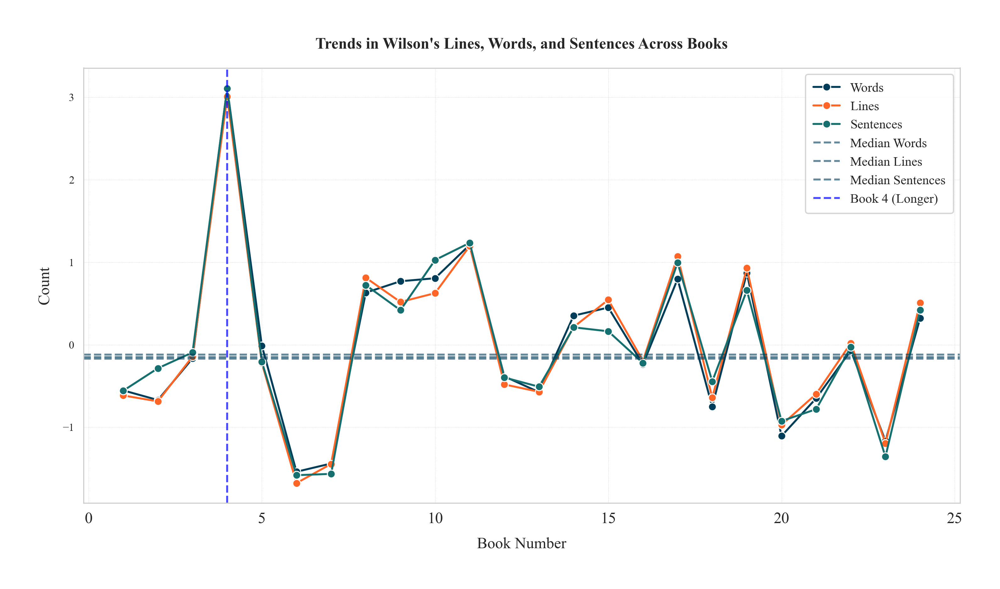

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

# Plot lines, words, and sentences across books
sns.lineplot(x=df["book_num"], y=df["scaled_num_words"], label="Words", marker="o") #, color="#fcc921"
sns.lineplot(x=df["book_num"], y=df["scaled_num_lines"], label="Lines", marker="o") #, color="#86C3BC"
sns.lineplot(x=df["book_num"], y=df["scaled_num_sentences"], label="Sentences", marker="o") #, color="#FD6626"

# Compute medians
median_words = df["scaled_num_words"].median()
median_lines = df["scaled_num_lines"].median()
median_sentences = df["scaled_num_sentences"].median()

# Add horizontal median lines
plt.axhline(y=median_words, linestyle="--", alpha=0.6, label="Median Words")
plt.axhline(y=median_lines, linestyle="--", alpha=0.6, label="Median Lines")
plt.axhline(y=median_sentences, linestyle="--", alpha=0.6, label="Median Sentences")

# Highlight Book 4
plt.axvline(x=4, color='blue', linestyle='--', alpha=0.7, label="Book 4 (Longer)")

# Labels and legend
plt.xlabel("Book Number")
plt.ylabel("Count")
plt.title("Trends in Wilson's Lines, Words, and Sentences Across Books")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-Trends_Lines_Words_Sentences.png")
plt.show()

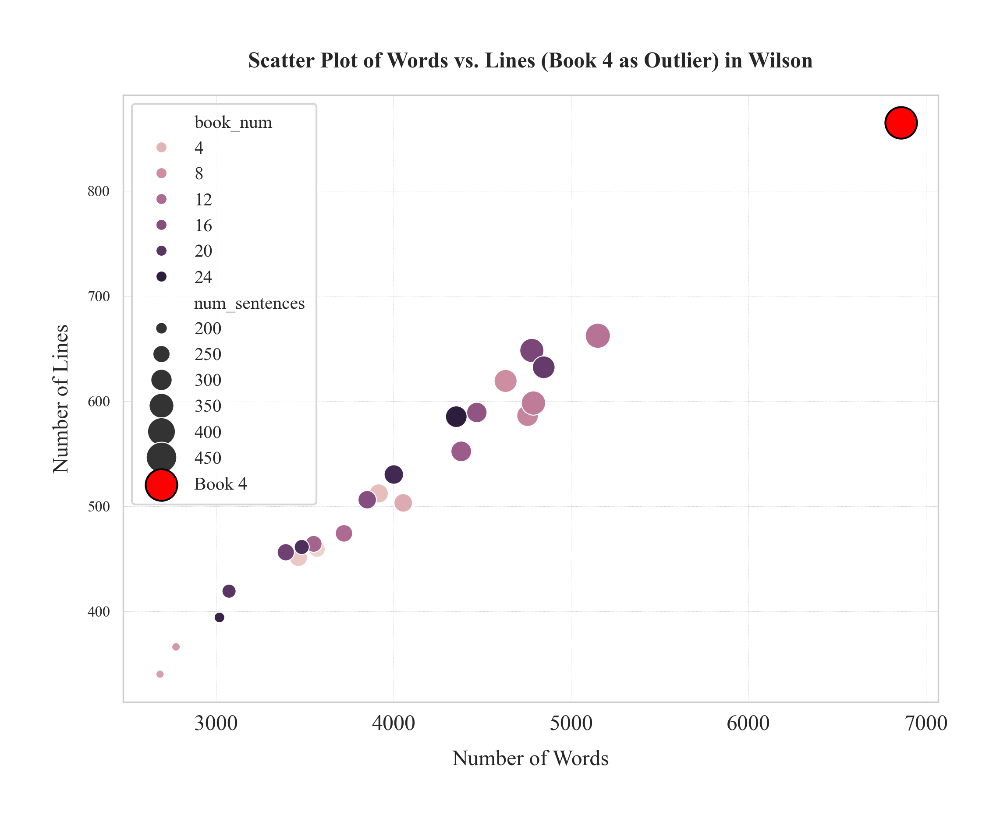

In [9]:
plt.figure(figsize=(8,6))

sns.scatterplot(data=df, x="num_words", y="num_lines", hue="book_num", size="num_sentences", sizes=(20, 300))

# Highlight Book 4
plt.scatter(df[df["book_num"] == 4]["num_words"], df[df["book_num"] == 4]["num_lines"], color="red", s=300, label="Book 4", edgecolors="black")

plt.xlabel("Number of Words")
plt.ylabel("Number of Lines")
plt.title("Scatter Plot of Words vs. Lines (Book 4 as Outlier) in Wilson")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-Scatter_Words_Lines.png")
plt.show()

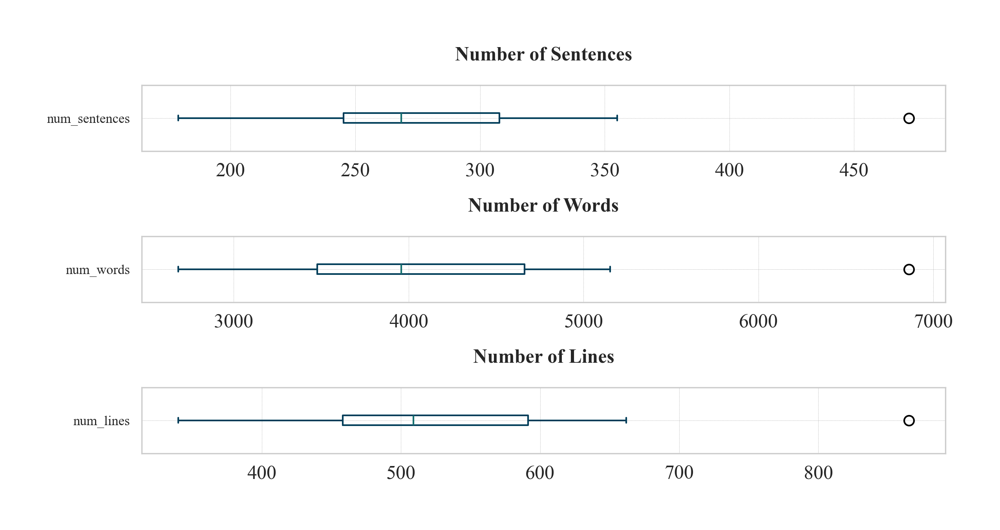

In [10]:
# Boxplots (one for each variable)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 4), sharex=False)

# Plot boxplots
df['num_sentences'].plot(kind='box', vert=False, ax=axes[0])
axes[0].set_title("Number of Sentences")

df['num_words'].plot(kind='box', vert=False, ax=axes[1])
axes[1].set_title("Number of Words")

df['num_lines'].plot(kind='box', vert=False, ax=axes[2])
axes[2].set_title("Number of Lines")

plt.tight_layout()
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-Boxplots_Sentences_Words_Lines.png")
plt.show()

In [11]:
# NLTK Pipeline for Tokenizing Text
# Includes lowercasing, tokenization, and stopword removal
# Customizable stopwords with inclusions and exclusions

import string
import nltk
import pandas as pd
from tqdm.notebook import tqdm
import re
from typing import List, Callable, Union, Set, Optional

# Download necessary NLTK resources
print("Downloading NLTK resources...")
nltk.download('punkt_tab')
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
print("Download complete.")

##############################################
# NLPPipeline Class
##############################################
class NLPPipeline:
    """
    A configurable NLP pipeline for linguistic text analysis.
    
    This class provides methods for text preprocessing, including:
    - Lowercasing
    - Tokenization using NLTK's word_tokenize
    - Punctuation removal with customizable punctuation sets
    - Stopword removal with customizable stopword lists
    """
    
    def __init__(self, language: str = 'english'):
        """
        Initialize the NLP pipeline.
        
        Args:
            language (str): Language for stopwords (default: 'english')
        """
        self.language = language
        self.stopwords = set(nltk.corpus.stopwords.words(language))
        self.custom_include_stopwords: Set[str] = set()
        self.custom_exclude_stopwords: Set[str] = set()
        self.update_stopwords()
        
        # Initialize punctuation set with string.punctuation
        self.default_punctuation = set(string.punctuation)
        self.keep_punctuation: Set[str] = set()
        self.punctuation_to_remove: Set[str] = set()
        self.update_punctuation()
    
    def update_stopwords(self) -> None:
        """
        Update the stopwords set based on custom inclusions and exclusions.
        """
        self.effective_stopwords = self.stopwords.copy()
        self.effective_stopwords |= self.custom_include_stopwords
        self.effective_stopwords -= self.custom_exclude_stopwords
    
    def update_punctuation(self) -> None:
        """
        Update the punctuation set based on custom inclusions and exclusions.
        """
        self.effective_punctuation = self.default_punctuation.copy()
        self.effective_punctuation -= self.keep_punctuation
        self.effective_punctuation |= self.punctuation_to_remove
    
    def customize_stopwords(self, include: Optional[Set[str]] = None, 
                           exclude: Optional[Set[str]] = None) -> None:
        """
        Customize the stopwords by including or excluding specific words.
        
        Args:
            include (Set[str], optional): Words to add to stopwords
            exclude (Set[str], optional): Words to remove from stopwords
        """
        if include:
            self.custom_include_stopwords |= include
        if exclude:
            self.custom_exclude_stopwords |= exclude
        self.update_stopwords()
        
        # Print summary of changes
        print(f"Stopwords customized:")
        if include:
            print(f"  Added: {include}")
        if exclude:
            print(f"  Removed: {exclude}")
        print(f"  Total stopwords: {len(self.effective_stopwords)}")
    
    def customize_punctuation(self, keep: Optional[Set[str]] = None,
                             remove: Optional[Set[str]] = None) -> None:
        """
        Customize the punctuation handling by specifying characters to keep or remove.
        
        Args:
            keep (Set[str], optional): Punctuation characters to keep
            remove (Set[str], optional): Additional characters to remove
        """
        if keep:
            self.keep_punctuation |= keep
        if remove:
            self.punctuation_to_remove |= remove
        self.update_punctuation()
        
        # Print summary of changes
        print(f"Punctuation customized:")
        if keep:
            print(f"  Keeping: {keep}")
        if remove:
            print(f"  Additional removals: {remove}")
        print(f"  Punctuation to be removed: {''.join(sorted(self.effective_punctuation))}")
    
    def lowercase(self, text: str) -> str:
        """
        Convert text to lowercase.
        
        Args:
            text (str): Input text
            
        Returns:
            str: Lowercase text
        """
        if not isinstance(text, str):
            return ""
        return text.lower()
    
    def tokenize(self, text: str) -> List[str]:
        """
        Tokenize text using NLTK's word_tokenize.
        
        Args:
            text (str): Input text
            
        Returns:
            List[str]: List of tokens
        """
        if not isinstance(text, str):
            return []
        text = text.replace("—", " ").replace("–", " ")
        return nltk.tokenize.word_tokenize(text)
    
    def remove_punctuation(self, tokens: List[str]) -> List[str]:
        """
        Remove punctuation from tokens or filter out punctuation-only tokens.
        
        Args:
            tokens (List[str]): List of tokens
            
        Returns:
            List[str]: Tokens with punctuation removed
        """
        # Create a translation table for punctuation removal
        punct_table = str.maketrans('', '', ''.join(self.effective_punctuation))
        
        # Apply translation to each token and filter out empty tokens
        cleaned_tokens = []
        for token in tokens:
            cleaned = token.translate(punct_table)
            if cleaned:  # Only add non-empty tokens
                cleaned_tokens.append(cleaned)
        
        return cleaned_tokens
    
    def remove_stopwords(self, tokens: List[str]) -> List[str]:
        """
        Remove stopwords from the list of tokens.
        
        Args:
            tokens (List[str]): List of tokens
            
        Returns:
            List[str]: Filtered list without stopwords
        """
        return [t for t in tokens if t.lower() not in self.effective_stopwords]
    
    def get_pipeline(self, lowercase: bool = True, 
                    tokenize: bool = True,
                    remove_punctuation: bool = True,
                    remove_stops: bool = True) -> List[Callable]:
        """
        Get a customized processing pipeline.
        
        Args:
            lowercase (bool): Include lowercasing step
            tokenize (bool): Include tokenization step
            remove_punctuation (bool): Include punctuation removal step
            remove_stops (bool): Include stopword removal step
            
        Returns:
            List[Callable]: List of processing functions
        """
        pipeline = []
        if lowercase:
            pipeline.append(self.lowercase)
        if tokenize:
            pipeline.append(self.tokenize)
        if remove_punctuation:
            pipeline.append(self.remove_punctuation)
        if remove_stops:
            pipeline.append(self.remove_stopwords)
        return pipeline
    
    def process_text(self, text: str, pipeline: Optional[List[Callable]] = None) -> Union[str, List[str]]:
        """
        Process a single text through the pipeline.
        
        Args:
            text (str): Text to process
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            Union[str, List[str]]: Processed text or tokens
        """
        if pipeline is None:
            pipeline = self.get_pipeline()
        
        result = text
        for transform in pipeline:
            try:
                result = transform(result)
            except Exception as e:
                print(f"Error applying {transform.__name__}: {e}")
        return result
    
    def process_series(self, series: pd.Series, pipeline: Optional[List[Callable]] = None) -> pd.Series:
        """
        Process a pandas Series of texts through the pipeline with progress bar.
        
        Args:
            series (pd.Series): Series containing texts
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            pd.Series: Series with processed texts/tokens
        """
        if pipeline is None:
            pipeline = self.get_pipeline()
        
        tqdm.pandas(desc="Processing texts")
        return series.progress_apply(lambda x: self.process_text(x, pipeline))
    
    def process_dataframe(self, df: pd.DataFrame, text_column: str, 
                         result_column: str, pipeline: Optional[List[Callable]] = None) -> pd.DataFrame:
        """
        Process a dataframe by applying the pipeline to a text column.
        
        Args:
            df (pd.DataFrame): Input dataframe
            text_column (str): Column containing texts to process
            result_column (str): Column name for storing processed results
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            pd.DataFrame: Processed dataframe
        """
        if text_column not in df.columns:
            raise ValueError(f"Column '{text_column}' not found in dataframe")
        
        result_df = df.copy()
        result_df[result_column] = self.process_series(df[text_column], pipeline)
        return result_df
##################################################
# End of NLPPipeline Class
##################################################
# Initialize the pipeline
nlp = NLPPipeline(language='english')

# Customize stopwords
nlp.customize_stopwords(
    include={'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten'},
    exclude={''}
)
# Customize punctuation
nlp.customize_punctuation(
    keep={'-', "'"},  # Keep hyphens and apostrophes
    remove={'…', '—','”','’','“'}  # Additional characters to remove
)

# Process with default pipeline (lowercase -> tokenize -> remove punctuation -> remove stopwords)
df = nlp.process_dataframe(df, 'text', 'tokens')

Download complete.
Stopwords customized:
  Added: {'two', 'six', 'nine', 'five', 'ten', 'three', 'four', 'seven', 'one', 'eight'}
  Removed: {''}
  Total stopwords: 208
Punctuation customized:
  Keeping: {"'", '-'}
  Additional removals: {'’', '”', '…', '“', '—'}
  Punctuation to be removed: !"#$%&()*+,./:;<=>?@[\]^_`{|}~—’“”…


[nltk_data] Downloading package punkt_tab to /Users/debr/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

In [12]:
df['num_tokens'] = df['tokens'].map(len)

In [13]:
from collections import Counter
counter = Counter()

df['tokens'].map(counter.update)
print(counter.most_common(30))

[('odysseus', 499), ('home', 363), ('would', 342), ('men', 315), ('back', 312), ('said', 284), ('man', 279), ('house', 271), ('gods', 266), ('come', 254), ('go', 246), ('son', 246), ('us', 244), ('zeus', 224), ('suitors', 220), ('ship', 219), ('father', 208), ('went', 206), ('telemachus', 201), ('like', 193), ('tell', 190), ('made', 186), ('sea', 184), ('let', 174), ('god', 168), ('came', 163), ('must', 161), ('inside', 152), ('away', 147), ('could', 145)]


Those most frequent tokens are exactly what one would expect from an Odyssey translation. What it is impressive, more if we consider modern interpretations (since 1500), the omission of mother and Penelope in the first 30 most frequent words, but 'suitors' does appear.

In [14]:
from collections import Counter ###
def count_words(df, column='tokens', preprocess=None, min_freq=2):

    # process tokens and update counter
    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens)

    # create counter and run through all data
    counter = Counter()
    df[column].progress_map(update)

    # transform counter into data frame
    freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
    freq_df = freq_df.query('freq >= @min_freq')
    freq_df.index.name = 'token'

    return freq_df.sort_values('freq', ascending=False)
freq_df = count_words(df)
freq_df.head(30)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

,freq
token,
odysseus,499
home,363
would,342
men,315
back,312
said,284
man,279
house,271
gods,266


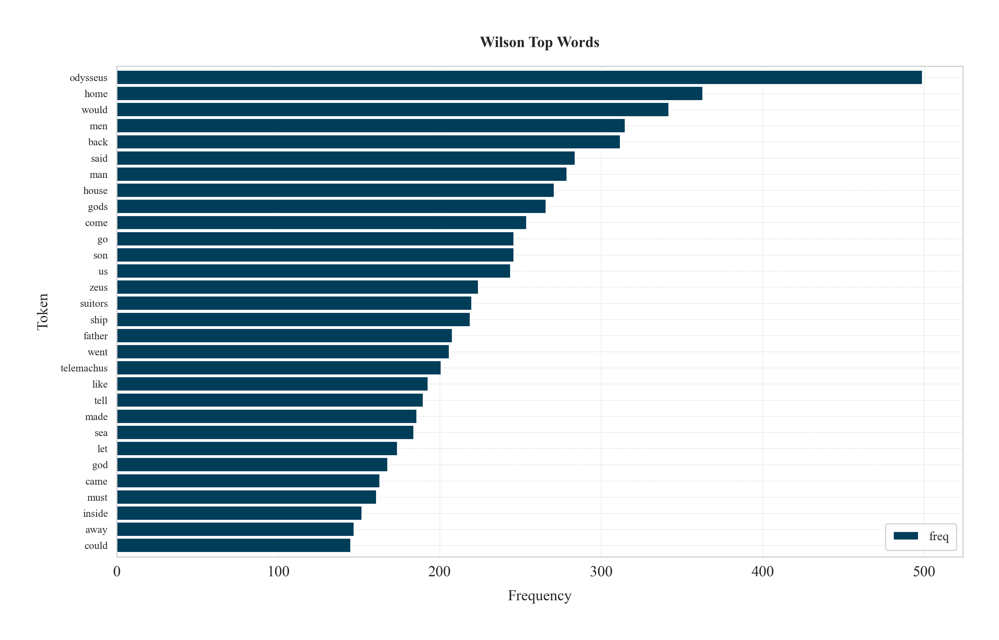

In [15]:
ax = freq_df.head(30).plot(kind='barh', width=0.9)
ax.invert_yaxis()
ax.set(xlabel='Frequency', ylabel='Token', title='Wilson Top Words')
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-Top_Words.png")
plt.show()

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

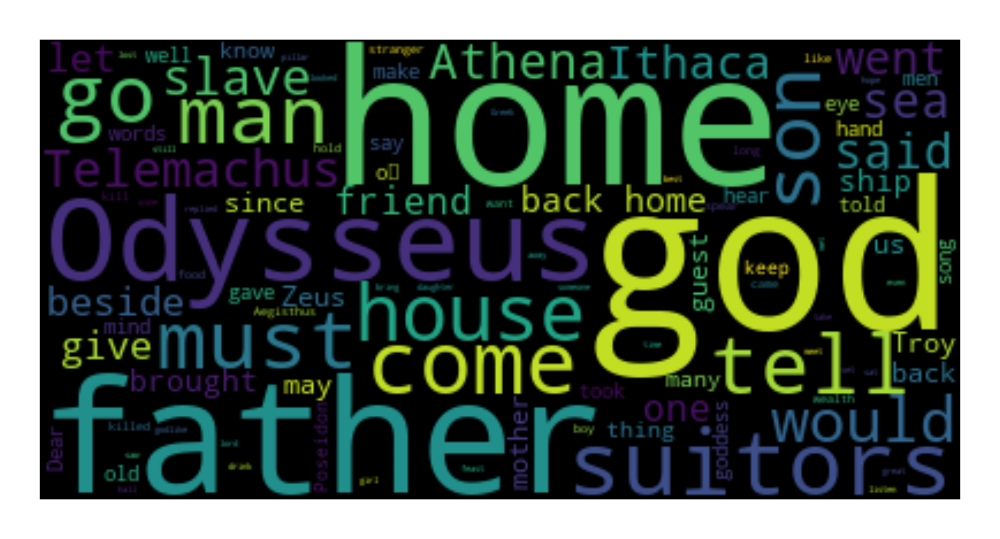

In [16]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt

text = df.query("book_num==1")['text'].values[0]
stopwords = set(nltk.corpus.stopwords.words('english'))
plt.figure(figsize=(12, 7)) ###
wc = WordCloud(max_words=100, stopwords=stopwords)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

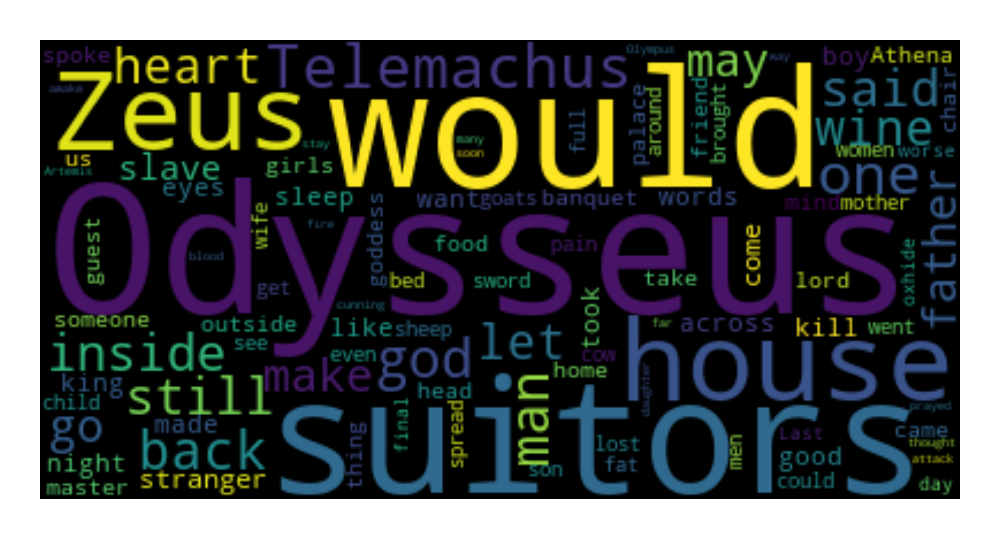

In [17]:
text = df.query("book_num==20")['text'].values[0]
stopwords = set(nltk.corpus.stopwords.words('english'))
plt.figure(figsize=(12, 7)) ###
wc = WordCloud(max_words=100, stopwords=stopwords)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

In [18]:
# finding if token in token-column, then summed up
token = 'penelope'
penelope = df['tokens'].map(lambda tokens: token in tokens).sum()
penelope


np.int64(17)

Processing texts:   0%|          | 0/1 [00:00<?, ?it/s]

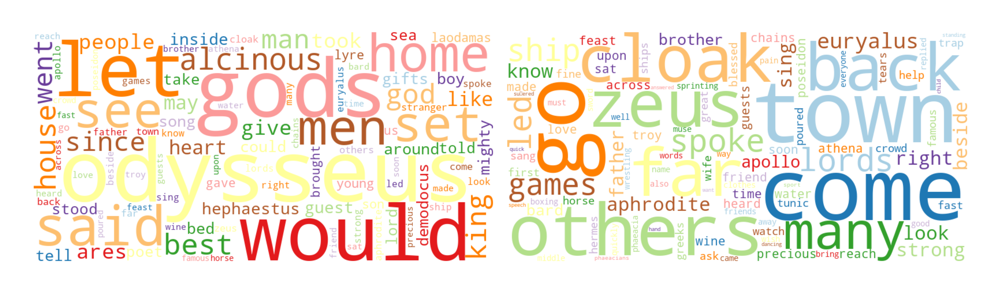

In [19]:
from wordcloud import WordCloud ###
from collections import Counter ###

def wordcloud(word_freq, title=None, max_words=200, stopwords=None):

    wc = WordCloud(width=800, height=400,
                   background_color= 'white', colormap="Paired",
                   max_font_size=150, max_words=max_words)

    # convert data frame into dict
    if type(word_freq) == pd.Series:
        counter = Counter(word_freq.fillna(0).to_dict())
    else:
        counter = word_freq

    # filter stop words in frequency counter
    if stopwords is not None:
        counter = {token:freq for (token, freq) in counter.items()
                              if token not in stopwords}
    wc.generate_from_frequencies(counter)

    plt.title(title)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

freq_df = count_words(df[df['book_num']==8])
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)###
wordcloud(freq_df['freq'], max_words=100)
plt.subplot(1,2,2)###
wordcloud(freq_df['freq'], max_words=100, stopwords=freq_df.head(50).index)
plt.tight_layout()###

## TF-IDF

In [20]:
# Compute the term frequency (TF) of tokens in a data frame
# Code adapted from 
# Blueprints for Text Analysis Using Python
# by Matthew Russell

import numpy as np

def compute_idf(df, column='tokens', preprocess=None, min_df=2):
    """A fucntion to compute the inverse document frequency (IDF) of tokens in a data frame.

    Args:
        df (_type_):  
        column (str, optional): _description_. Defaults to 'tokens'.
        preprocess (_type_, optional): _description_. Defaults to None.
        min_df (int, optional): _description_. Defaults to 2.
    """

    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(set(tokens))

    # count tokens
    counter = Counter()
    df[column].progress_map(update)

    # create data frame and compute idf
    idf_df = pd.DataFrame.from_dict(counter, orient='index', columns=['df'])
    idf_df = idf_df.query('df >= @min_df')
    idf_df['idf'] = np.log(len(df)/idf_df['df'])+0.1
    idf_df.index.name = 'token'
    return idf_df

idf_df = compute_idf(df)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

In [21]:
idf_df.sort_values('idf', ascending=False).head(30)

,df,idf
token,,
trojan,2,2.584907
firelight,2,2.584907
violets,2,2.584907
gazed,2,2.584907
barren,2,2.584907
clutching,2,2.584907
cypress,2,2.584907
explained,2,2.584907
seagull,2,2.584907


In [22]:
idf_df.sample(10, random_state=42)

,df,idf
token,,
suﬀer,14,0.638997
innocent,2,2.584907
darkness,10,0.975469
artistry,2,2.584907
tough,6,1.486294
pale,5,1.668616
bent,5,1.668616
chair,15,0.570004
hyacinth,2,2.584907


In [23]:
idf_df.sample(10, random_state=40)

,df,idf
token,,
fix,6,1.486294
wealthy,3,2.179442
bright-eyed,7,1.332144
woodland,2,2.584907
laborers,3,2.179442
mother,20,0.282322
laws,3,2.179442
distressing,2,2.584907
heroic,5,1.668616


In [24]:
idf_tokens = idf_df.query('idf > 2').index
print(idf_tokens[:51])

Index(['embroidered', 'subject', 'bolt', 'warned', 'chains', 'contribution',
       'heroes', 'flashed', 'plates', 'muse', 'vengeance', 'view', 'longhorn',
       'phemius', 'captured', 'holds', 'stranded', 'party', 'copper', 'rams',
       'fun', 'darted', 'strap', 'carver', 'dismiss', 'sponges', 'information',
       'disasters', 'reaching', 'owl-eyed', 'woolen', 'alert', 'well-born',
       'keeps', 'array', 'forecasts', 'belongs', 'hook', 'sack', 'debts',
       'hill', 'observing', 'feeling', 'source', 'enchanting', 'monstrous',
       'disapprove', 'vines', 'inspired', 'sparkling', 'feelings'],
      dtype='object', name='token')


# Thematic Analysis of Wilson's IDF Tokens in *The Odyssey*

Wilson's translation of *The Odyssey* reveals fascinating linguistic patterns through IDF (Inverse Document Frequency) token analysis. By organizing these high-IDF terms into thematic categories, we gain insight into the distinctive elements that characterize Homer's epic as interpreted by Wilson.

## Thematic Categories

### 1. Mythological & Legendary Figures

The divine and legendary characters form a crucial framework for the narrative:

- **Polyphemus** — The one-eyed Cyclops whose blinding by Odysseus sparks Poseidon's wrath
- **Olympian** — Relating to the gods who guide and obstruct the hero's journey
- **Taphian** — Seafaring people whose presence highlights the maritime world of the epic
- **Atlas** — The Titan whose cosmic significance adds depth to the mythological landscape
- **Phemius** — The bard whose songs parallel Homer's own storytelling function

### 2. Social & Cultural Aspects

The importance of hospitality (*xenia*) and social structures permeates the narrative:

- **Banqueters** & **Dine** — Communal eating as social ritual
- **Guest-friend** — The sacred bond between host and visitor
- **Danced** — Physical expression of community and celebration
- **Plates** & **Houses** — Material elements of domestic life
- **Deserves** — Notions of justice and merit in social relations

### 3. Objects & Physical Elements

Tangible items anchor the narrative in material reality:

- **Latch**, **Strap**, **Bolt** — Mechanisms of security and confinement
- **Pillars** — Architectural elements symbolizing stability and power
- **Soil** — Connection to land and homeland
- **Vines** — Agricultural abundance and the gifts of Dionysus
- **Copper** — Metalwork reflecting technological sophistication

### 4. Actions & Movement

The epic's dynamism is captured through terms of motion and agency:

- **Flashed** — Swift movement or sudden revelation
- **Clambered** — Difficult physical movement reflecting struggle
- **Sunk** — Downward motion tied to fate and disaster
- **Tame** — Control over natural or wild forces
- **Braver** — Demonstrations of *arete* (excellence) through courage
- **Captured** — The power dynamics of victory and defeat

### 5. Cognitive & Emotional Concepts

The inner landscape of characters manifests through:

- **Unknown** & **Information** — The quest for knowledge
- **Determined** — Willpower as driving force
- **Folly** — The consequences of poor judgment
- **Forecasts** — Attempts to understand fate and future
- **Rages** — Emotional intensity as plot catalyst
- **Absurd** — Recognition of cosmic irony
- **Feeling** — The emotional undercurrent of heroic action

## Conclusion

This analysis reveals that Wilson's translation doesn't merely recount Odysseus's homeward journey—it creates a rich tapestry where mythological elements intersect with material culture, social practices, physical action, and emotional depth. The distinctive "flavor" of this translation emerges from Wilson's attentiveness to both the cosmic and intimate dimensions of Homer's epic, carefully balancing divine intervention with human agency and emotion.

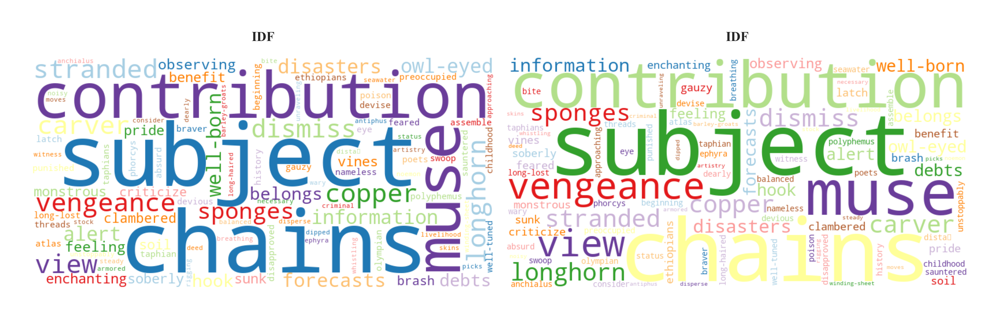

In [25]:
# high IDF means rare (interesting) term
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)###
wordcloud(idf_df['idf'], title='IDF', max_words=100)
plt.subplot(1,2,2)###
wordcloud(idf_df['idf'], title='IDF', max_words=100, stopwords=idf_df.query('idf < 2').index)
plt.tight_layout()###
plt.show()


In [26]:
# not in book: for more data: joining is faster
freq_df = freq_df.join(idf_df)
freq_df['tfidf'] = freq_df['freq'] * freq_df['idf']

Processing texts:   0%|          | 0/1 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/1 [00:00<?, ?it/s]

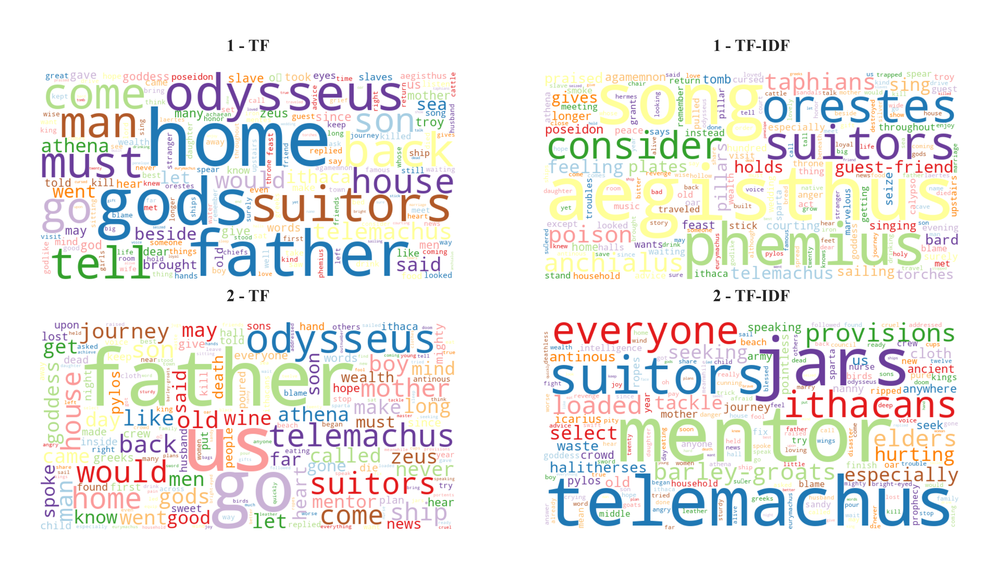

In [27]:
freq_1 = count_words(df[df['book_num'] == 1])
freq_2 = count_words(df[df['book_num'] == 2])

freq_1['tfidf'] = freq_1['freq'] * idf_df['idf']
freq_2['tfidf'] = freq_2['freq'] * idf_df['idf']

plt.figure(figsize=(12,6)) ###
#wordcloud(freq_df['freq'], title='All years', subplot=(1,3,1))
plt.subplot(2,2,1)###
wordcloud(freq_1['freq'], title='1 - TF',
          stopwords=[''])
plt.subplot(2,2,2)###
wordcloud(freq_1['tfidf'], title='1 - TF-IDF',
          stopwords=[''])
plt.subplot(2,2,3)###
wordcloud(freq_2['freq'], title='2 - TF',
          stopwords=[''])
plt.subplot(2,2,4)###
wordcloud(freq_2['tfidf'], title='2 - TF-IDF',
          stopwords=[''])

## Keywords

In [28]:
# From Blueprints for Text Analysis Using Python
# by Matthew Russell
# Published by O'Reilly Media, Inc., 2021
import textacy

if textacy.__version__ < '0.11': # as in printed book
    from textacy.text_utils import KWIC

else: # for textacy 0.11.x
    from textacy.extract.kwic import keyword_in_context

    def KWIC(*args, **kwargs):
        # call keyword_in_context with all params except 'print_only'
        return keyword_in_context(*args,
                           **{kw: arg for kw, arg in kwargs.items()
                            if kw != 'print_only'})

def kwic(doc_series, keyword, window=35, print_samples=5):

    def add_kwic(text):
        kwic_list.extend(KWIC(text, keyword, ignore_case=True,
                              window_width=window, print_only=False))

    kwic_list = []
    doc_series.progress_map(add_kwic)

    if print_samples is None or print_samples==0:
        return kwic_list
    else:
        k = min(print_samples, len(kwic_list))
        print(f"{k} random samples out of {len(kwic_list)} " + \
              f"contexts for '{keyword}':")
        for sample in random.sample(list(kwic_list), k):
            print(re.sub(r'[\n\t]', ' ', sample[0])+'  '+ \
                  sample[1]+'  '+\
                  re.sub(r'[\n\t]', ' ', sample[2]))

In [29]:
import random
random.seed(22)
keyword = 'spear'
kwic(df['text'], keyword, print_samples=10)
#kwic(df[df['book_num'] == 8]['text'], 'spear', print_samples=10)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

10 random samples out of 69 contexts for 'spear':
s being broken and dying men. They   spear  ed them there like fish. A gruesome
our guest.” He took the stranger’s   spear  , laid it on deck, then climbed on 
e the high-roofed hall, he set her   spear   beside a pillar in a polished stan
the closely fitted door, another’s   spear   of ash and heavy bronze fell on th
ipped his sword hilt and his heavy   spear  , so desperate to go hurt the Troja
 So did his eyeball crackle on the   spear  . Horribly then he howled, the rock
rapped on his sword, picked up his   spear  , and stood beside his chair, next 
ts and studded shields and pointed   spear  s. Athena stood by them with a gold
 nothing.” The six men threw their   spear  s as he had said; at once Athena ma
 men cut down  in battle by bronze   spear  s, still dressed in armor stained w


## Bigrams

In [30]:
def ngrams(tokens, n=2, sep=' ', stopwords=set()):
    return [sep.join(ngram) for ngram in zip(*[tokens[i:] for i in range(n)])
            if len([t for t in ngram if t in stopwords])==0]

df['bigrams'] = df['tokens'].progress_apply(ngrams, n=2, stopwords=stopwords)

count_words(df, 'bigrams').head(30)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

,freq
token,
back home,83
come back,35
let us,35
slave girls,30
go back,26
said ‘,26
come home,24
deathless gods,23
old man,22


Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/1 [00:00<?, ?it/s]

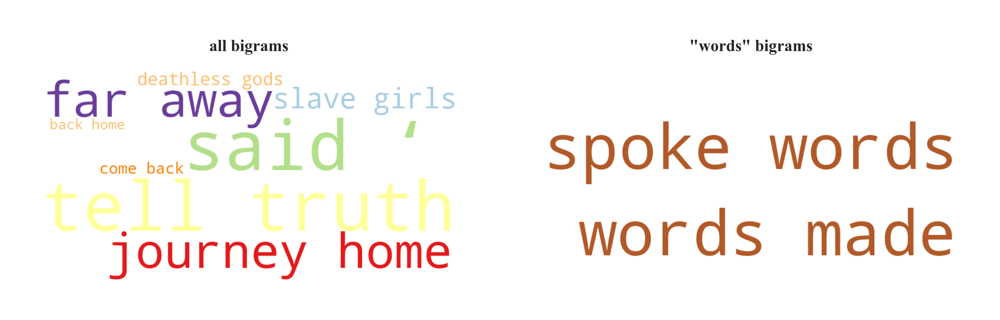

In [31]:
# recompute IDF with bigrams

idf_df = compute_idf(df) ### re-initialize to be safe
# concatenate existing IDF data frame with bigram IDFs
idf_df = pd.concat([idf_df, compute_idf(df, 'bigrams', min_df=10)])

freq_df = count_words(df[df['book_num'] == 4], 'bigrams')
freq_df['tfidf'] = freq_df['freq'] * idf_df['idf']

plt.figure(figsize=(12,6))
plt.subplot(1,2,1) ###
wordcloud(freq_df['tfidf'], title='all bigrams', max_words=50)

plt.subplot(1,2,2) ###
# plt.tight_layout() ###
where = freq_df.index.str.contains('words', case=False)
wordcloud(freq_df[where]['freq'], title='"words" bigrams', max_words=50)

## Counting keywords

In [32]:
def count_keywords(tokens, keywords):
    tokens = [t for t in tokens if t in keywords]
    counter = Counter(tokens)
    return [counter.get(k, 0) for k in keywords]

In [33]:
def count_keywords_by(df, by, characters, column='tokens'):

    df = df.reset_index(drop=True) # if the supplied dataframe has gaps in the index
    freq_matrix = df[column].progress_apply(count_keywords, keywords=keywords)
    freq_df = pd.DataFrame.from_records(freq_matrix, columns=keywords)
    freq_df[by] = df[by] # copy the grouping column(s)

    return freq_df.groupby(by=by).sum().sort_values(by)

keywords = ['ship', 'words', 'sea', 'freedom', 'odysseus', 'spear', 'war', 'death', 'home', 'wine']
freq_df = count_keywords_by(df, 'book_num', keywords)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

In [34]:
pd.options.display.max_rows = 20
freq_df

,ship,words,sea,freedom,odysseus,spear,war,death,home,wine
book_num,,,,,,,,,,
1,5,6,9,0,18,4,1,2,30,2
2,11,5,3,0,18,0,0,5,16,7
3,9,1,11,0,6,0,1,3,18,11
4,11,14,29,0,17,0,2,4,31,4
5,3,4,34,0,22,0,1,5,13,2
...,...,...,...,...,...,...,...,...,...,...
20,0,6,1,0,23,1,1,0,5,8
21,1,4,0,0,23,2,1,1,7,5
22,0,9,3,0,42,8,2,8,8,2


In [35]:
%matplotlib inline
import pandas as pd
from tqdm import tqdm
tqdm.pandas()
pd.options.display.max_colwidth = 150 ###
import numpy as np
import re
import sys
import os
import matplotlib.pyplot as plt
# Add the directory containing visualization_utils.py to path
sys.path.append("/Users/debr/English-Homer/")
import visualization_utils as viz
import seaborn as sns
sns.set_style("whitegrid")
# palette astroblue   orange   genoa      carrot    tawny     neptune      SELAGO    mako   black
color = ['#003D59', '#FD6626','#177070','#FB871D','#641B5E','#86C3BC','#F5E1FD','#414A4F','k']
danB_plotstyle = {'figure.figsize': (12, 7), 
               'axes.labelsize': 'large', # fontsize for x and y labels (was large)
               'axes.titlesize': 'large', # fontsize for title
               'axes.titleweight': 'bold', # font type for title
               'xtick.labelsize': 'large', # fontsize for x 
               'ytick.labelsize':'small', # fontsize fory ticks
               'grid.color': 'k', # grid color
                'grid.linestyle': ':', # grid line style
                'grid.linewidth': 0.2, # grid line width
                'font.family': 'Times New Roman', # font family
                'grid.alpha': 0.5, # transparency of grid
               'figure.dpi': 300, # figure display resolution
               'savefig.bbox': 'tight', # tight bounding box
               'savefig.pad_inches': 0.4, # padding to use when saving
               'axes.titlepad': 15, # title padding
               'axes.labelpad': 8, # label padding
               'legend.borderpad': .6, # legend border padding
               'axes.prop_cycle': plt.cycler(
                color=color) # color cycle for plot lines
               }

# adjust matplotlib defaults
plt.rcParams.update(danB_plotstyle)

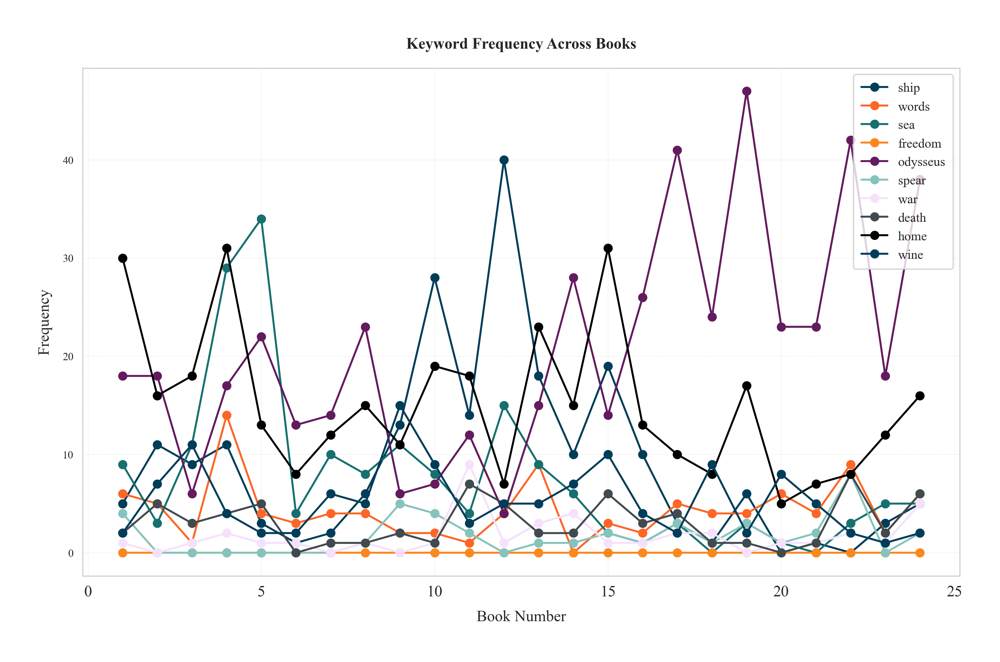

In [36]:
freq_df.plot(kind='line', figsize=(12, 7), marker='o')
plt.title('Keyword Frequency Across Books')
plt.xlabel('Book Number')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

100%|██████████| 24/24 [00:00<00:00, 4044.65it/s]


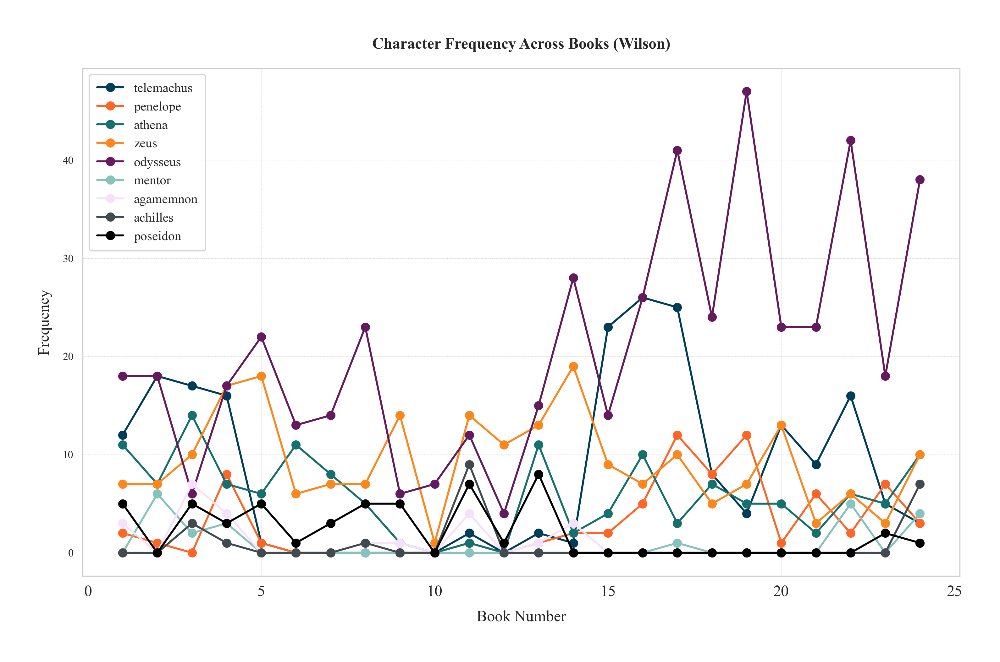

In [37]:
# Plot characters by relative freq 

characters = ['telemachus', 'penelope', 'athena', 'zeus', 'odysseus', 'mentor', 'agamemnon', 'achilles', 'poseidon']


def count_keywords_by(df, by, keywords, column='tokens'):
    df = df.reset_index(drop=True) # if the supplied dataframe has gaps in the index
    freq_matrix = df[column].progress_apply(count_keywords, keywords=keywords)
    freq_df = pd.DataFrame.from_records(freq_matrix, columns=keywords)
    freq_df[by] = df[by] # copy the grouping column(s)

    return freq_df.groupby(by=by).sum().sort_values(by)

freq_df = count_keywords_by(df, by='book_num', keywords=characters)

freq_df.plot(kind='line', figsize=(12, 7), marker='o')
plt.title('Character Frequency Across Books (Wilson)')
plt.xlabel('Book Number')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.savefig("/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Wilson-Character_Frequency.png")
plt.show()

100%|██████████| 10/10 [00:00<00:00, 2225.69it/s]


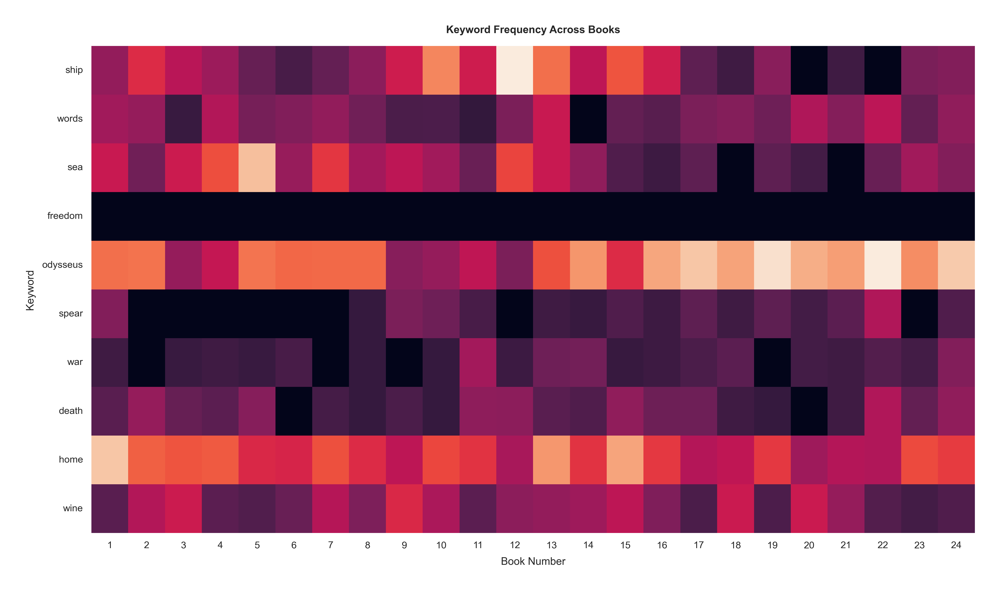

In [38]:
keywords = ['ship', 'words', 'sea', 'freedom', 'odysseus', 'spear', 'war', 'death', 'home', 'wine']

freq_df = count_keywords_by(df, by='book_num', keywords=keywords)

# compute relative frequencies based on total number of tokens per year
freq_df = freq_df.div(df.groupby('book_num')['num_tokens'].sum(), axis=0)
# apply square root as sublinear filter for better contrast
freq_df = freq_df.progress_apply(np.sqrt)

plt.figure(figsize=(18, 10)) ###
sns.set(font_scale=1) ###
# dark  ax=axs[1], cmap='gray'
sns.heatmap(data=freq_df.T, 
            xticklabels=True, yticklabels=True, cbar=False) # , cmap="Reds"

# rotate y labels
plt.yticks(rotation=0)
plt.title('Keyword Frequency Across Books')
plt.xlabel('Book Number')
plt.ylabel('Keyword')
plt.show()


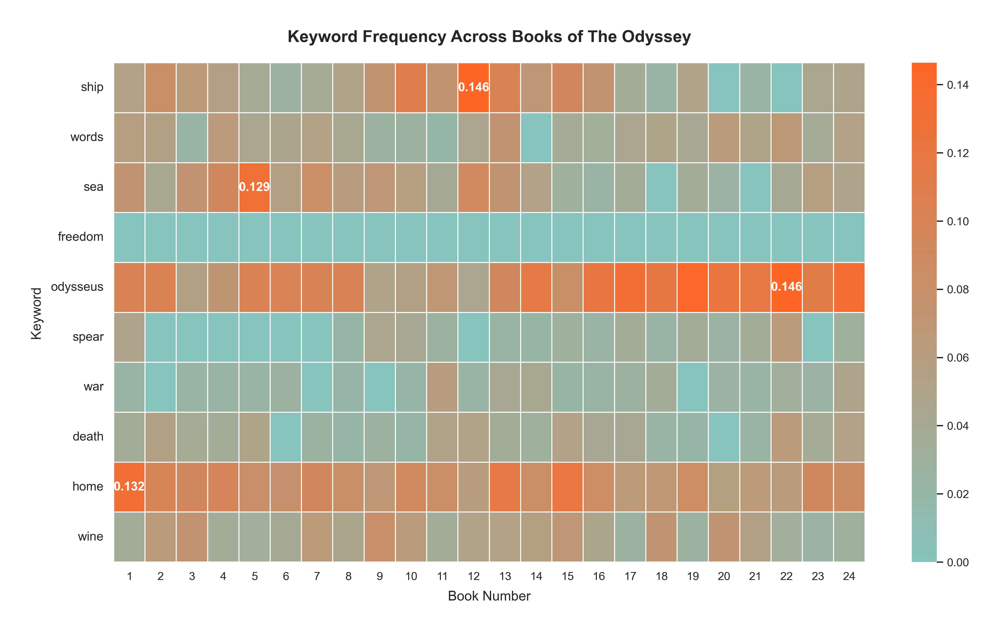

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

#keywords = list(freq_df.index)  # Get keywords from the dataframe index
# Your custom color palette
neptune = '#86C3BC'
astroblue = '#FD6626' #'#003D59'
custom_colors = ['#003D59', '#FD6626', '#177070', '#FB871D', '#641B5E', '#86C3BC', '#F5E1FD', '#414A4F', 'k']

# Create custom colormap
custom_cmap = LinearSegmentedColormap.from_list('neptune_blue', [neptune, astroblue])

# Create figure
plt.figure(figsize=(14, 8))

# Create the heatmap with improved aesthetics
ax = sns.heatmap(
    data=freq_df.T,
    vmin=0,
    vmax=freq_df.values.max(),
    cmap=custom_cmap,
    xticklabels=True, 
    yticklabels=True,
    cbar=True,
    linewidths=0.5,
    linecolor='white'
)

# Improve the axes and labels
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=11)

# Add title and axis labels
plt.title('Keyword Frequency Across Books of The Odyssey',fontsize=16, pad=20)
plt.xlabel('Book Number', fontsize=13)
plt.ylabel('Keyword', fontsize=13)

# Add annotations for highest frequency words
for i in range(len(keywords)):
    max_idx = freq_df.T.iloc[i].argmax()
    max_val = freq_df.T.iloc[i, max_idx]
    if max_val > freq_df.values.max() * 0.8:  # Only annotate the most significant values
        ax.text(max_idx + 0.5, i + 0.5, f'{max_val:.3f}', 
                ha='center', va='center', color='white', fontweight='bold')

# Adjust layout
plt.tight_layout()

plt.savefig('/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Odyssey_Wilson-keyword_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

100%|██████████| 9/9 [00:00<00:00, 7697.54it/s]


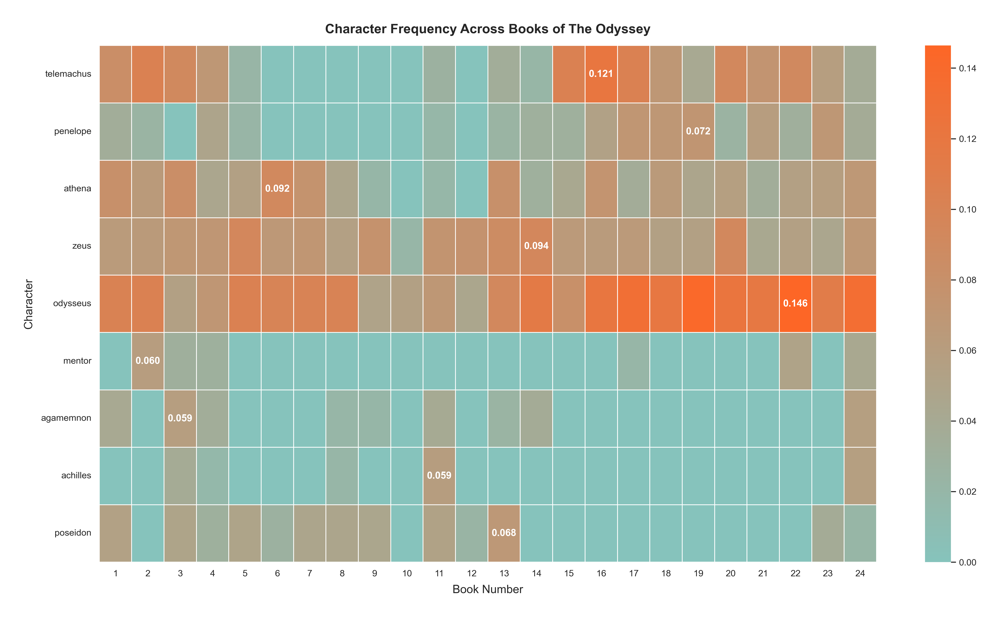

In [46]:
# Define keywords and process them
characters = ['telemachus', 'penelope', 'athena', 'zeus', 'odysseus', 'mentor', 'agamemnon', 'achilles', 'poseidon']
freq_df = count_keywords_by(df, by='book_num', keywords=characters)
# compute relative frequencies based on total number of tokens per year
freq_df = freq_df.div(df.groupby('book_num')['num_tokens'].sum(), axis=0)
# apply square root as sublinear filter for better contrast
freq_df = freq_df.progress_apply(np.sqrt)

# Define color scheme
neptune = '#86C3BC'
astroblue = '#FD6626'  # orange instead of blue
custom_colors = ['#003D59', '#FD6626', '#177070', '#FB871D', '#641B5E', '#86C3BC', '#F5E1FD', '#414A4F', 'k']
# Create custom colormap
custom_cmap = LinearSegmentedColormap.from_list('neptune_orange', [neptune, astroblue])

# Create plot with custom dimensions
plt.figure(figsize=(18, 10))

# Create the heatmap with custom aesthetics
ax = sns.heatmap(
    data=freq_df.T,
    vmin=0,
    vmax=freq_df.values.max(),
    cmap=custom_cmap,
    xticklabels=True,
    yticklabels=True,
    cbar=True,
    linewidths=0.5,
    linecolor='white'
)

# Format labels and title
plt.yticks(rotation=0)
plt.title('Character Frequency Across Books of The Odyssey', fontsize=16)
plt.xlabel('Book Number', fontsize=14)
plt.ylabel('Character', fontsize=14)

# Add annotations for highest frequency words
for i in range(len(characters)):
    max_idx = freq_df.T.iloc[i].argmax()
    max_val = freq_df.T.iloc[i, max_idx]
    #if max_val > freq_df.values.max() * 0.8:  # Only annotate the most significant values
    ax.text(max_idx + 0.5, i + 0.5, f'{max_val:.3f}', 
    ha='center', va='center', color='white', fontweight='bold')
        
# Show the plot
plt.tight_layout()
plt.savefig('/Users/debr/English-Homer/EDA_by_Author/Wilson_EDA/plots/Odyssey_Wilson-characters_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

In [41]:
# save the dataframe
df.to_csv('/Users/debr/odysseys_en/Odyssey_dfs/Odyssey_Wilson_eda_END.csv', index=False)

import nltk
nltk.download('stopwords')
stopwords = set(nltk.corpus.stopwords.words('english'))
def remove_stop(tokens):
    return [t for t in tokens if t.lower() not in stopwords]
include_stopwords = {'dear', 'regards', 'must', 'would', 'also'}
exclude_stopwords = {'against'}

stopwords |= include_stopwords
stopwords -= exclude_stopwords

def tokenize(text):
    return re.findall(r'[\w-]*\p{L}[\w-]*', text)

("|".join(tokens))

def prepare(text, pipeline):
    tokens = text
    for transform in pipeline:
        tokens = transform(tokens)
    return tokens

pipeline = [str.lower, tokenize, remove_stop]

df['tokens'] = df['text'].progress_apply(prepare, pipeline=pipeline)

# Words KDE plot

sns.kdeplot(df['num_lines'], label="Lines", fill=True, alpha=0.4)


plt.xlabel("Count")
plt.ylabel("Density")
plt.title("Kernel Density Estimation (KDE) of Lines, Sentences, and Words")
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.show()

# Words KDE plot

sns.kdeplot(df['num_sentences'], label="Sentences", fill=True, alpha=0.4)

plt.xlabel("Count")
plt.ylabel("Density")
plt.title("Kernel Density Estimation (KDE) of Lines, Sentences, and Words")
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.show()